# Advanced Lane Detection

## 1. Camera calibration

In [659]:
import os
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.signal import find_peaks_cwt
%matplotlib inline

# Load chessboard images
fname = 'camera_cal/calibration{}.jpg'.format(2)
img = cv2.imread(fname)

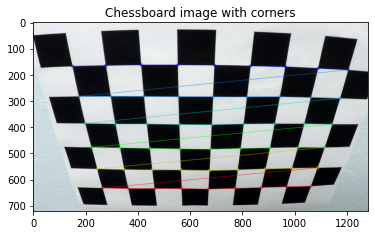

In [660]:
# object points
nx = 9 
ny = 6 

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)
    plt.title("Chessboard image with corners")
    plt.show()

In [661]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Step through the list and search for chessboard corners
for i in range(1,21):
    fname = 'camera_cal/calibration{}.jpg'.format(i)
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        print(fname)
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (8,6), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)

camera_cal/calibration2.jpg
camera_cal/calibration3.jpg
camera_cal/calibration6.jpg
camera_cal/calibration7.jpg
camera_cal/calibration8.jpg
camera_cal/calibration9.jpg
camera_cal/calibration10.jpg
camera_cal/calibration11.jpg
camera_cal/calibration12.jpg
camera_cal/calibration13.jpg
camera_cal/calibration14.jpg
camera_cal/calibration15.jpg
camera_cal/calibration16.jpg
camera_cal/calibration17.jpg
camera_cal/calibration18.jpg
camera_cal/calibration19.jpg
camera_cal/calibration20.jpg


Text(0.5, 1.0, 'Undistorted Image')

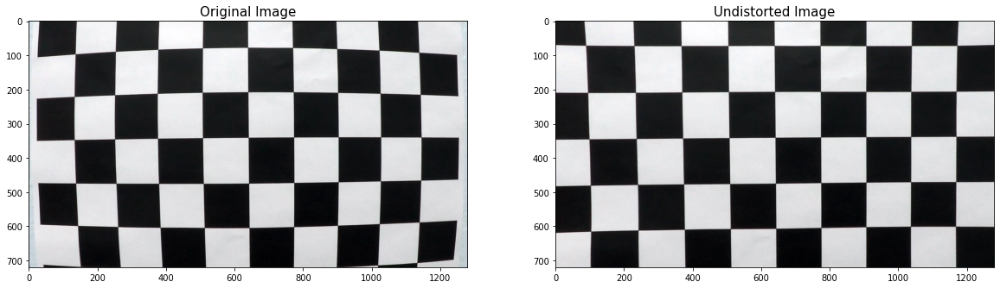

In [662]:
# Test undistortion on an image
fname = 'camera_cal/calibration{}.jpg'.format(1)
img = cv2.imread(fname)
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('calibration_wide/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "wide_dist_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=15)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=15)

## 2. Edge Detection

In [663]:
# loading the camera matrix and distortion coefficients
def camera_matrix():
    dist_pickle = pickle.load(open("calibrated_camera/camera_cal_pickle.p", "rb"))
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]
    return mtx, dist

def cal_undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)  
    return undist

def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def gaussian_blur(img, kernel_size):
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

In [664]:
def region_of_interest(img):

    imshape = img.shape
    vertices = np.array([[(0.*imshape[1],imshape[0]),(0.45*imshape[1], imshape[0]/1.8), (0.55*imshape[1], imshape[0]/1.8), (0.99*imshape[1],imshape[0])]], dtype=np.int32)
    
    #defining a blank mask to start with
    mask = np.zeros_like(img)   

    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (1,) * channel_count
#        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 1 
           
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)   
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [665]:
def abs_sobel_threshold(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate directional gradient
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    if orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return grad_binary

def mag_threshold(image, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobelxy = np.sqrt(sobelx**2+sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    # 5) Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
    return mag_binary

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate gradient direction
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    gradient_direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    dir_binary = np.zeros_like(gradient_direction)
    dir_binary[(gradient_direction>=thresh[0])&(gradient_direction<=thresh[1])] = 1
    
    return dir_binary

def color_threshold(img, s_thresh=(0,255), v_thresh=(0,255)):
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel>=s_thresh[0]) & (s_channel<=s_thresh[1])] = 1
    
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    v_channel = hsv[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel>=v_thresh[0]) & (v_channel<=v_thresh[1])] = 1   
    
    c_binary = np.zeros_like(s_channel)
    c_binary[(s_binary==1) & (v_binary==1)] = 1
    
    return c_binary
    

def thresh_pipeline(img, gradx_thresh=(0,255), grady_thresh=(0,255), s_thresh=(0, 255), v_thresh=(0, 255)):
    
    gradx = abs_sobel_threshold(img, orient='x', thresh=gradx_thresh)
    grady = abs_sobel_threshold(img, orient='y', thresh=grady_thresh)
    c_binary = color_threshold(img, s_thresh=s_thresh, v_thresh=v_thresh)
    
    
    # Combine these thresholded binary images
    thresh_binary = np.zeros_like(img[:,:,0])     
    thresh_binary[(gradx==1) & (grady==1) | (c_binary==1)] = 255
#     thresh_binary[c_binary==1] = 255
#     thresh_binary[(sxbinary==1)|(s_binary==1)] = 1 
    
    return thresh_binary

In [666]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0,ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1,ksize=sobel_kernel))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return grad_binary

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return mag_binary

def dir_thresh(image, sobel_kernel=3, dir_thresh=(0, np.pi/2)):
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= dir_thresh[0]) & (absgraddir <= dir_thresh[1])] = 1
    return dir_binary

def combined_thresh(img, SOBEL_KERNEL=3, THRESH=(0, 255), MAG_THRESH=(0,255),  DIR_TRESH=(0, np.pi/2)):
    # Convert to grayscale
    comb_img =  img
    # Apply thresholding functions
    gradx = abs_sobel_thresh(comb_img, orient='x', sobel_kernel=SOBEL_KERNEL, thresh=THRESH)
    grady = abs_sobel_thresh(comb_img, orient='y', sobel_kernel=SOBEL_KERNEL, thresh=THRESH)
    mag_binary = mag_thresh(comb_img, sobel_kernel=SOBEL_KERNEL, mag_thresh=MAG_THRESH)
    dir_binary = dir_thresh(comb_img, sobel_kernel=SOBEL_KERNEL, dir_thresh=DIR_TRESH)
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

def channel_thresh(img,CHL_THRESH=(0, 255)):
    s_binary = np.zeros_like(img)
    s_binary[(img > CHL_THRESH[0]) & (img <= CHL_THRESH[1])] = 1
    return s_binary

## 3. Perspective transform

In [667]:
def img_persp(img):
    # src points
    src = np.float32([[249, 690],[579, 460],[704, 460],[1058, 690]])
    # destination points
    x_max = img.shape[1]
    y_max = img.shape[0]
    img_size = (img.shape[1],img.shape[0])
    offset = 0
    dst = np.float32([[249, y_max],[249, offset],[1058, offset],[1058, y_max]])

    M = cv2.getPerspectiveTransform(src, dst)

    inv_M = cv2.getPerspectiveTransform(dst, src)

    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR) 
    return warped, M, inv_M

def perspective_transformer():
    global src, dst, M, Minv
    
    # Define the perspective transformation area
    img_width = 1280
    img_height = 720

    bot_width = .76 # percent of bottom
    mid_width = .17 #.17
    height_pct = .66 #.66
    bottom_trim = .935
    src = np.float32([
        [img_width*(.5-mid_width/2), img_height*height_pct],
        [img_width*(.5+mid_width/2), img_height*height_pct],
        [img_width*(.5+bot_width/2), img_height*bottom_trim],
        [img_width*(.5-bot_width/2), img_height*bottom_trim]
    ])
    
    offset = img_width*.2
    
    dst = np.float32([
        [offset, 0],
        [img_width-offset, 0],
        [img_width-offset, img_height],
        [offset, img_height]
    ])
    
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)

In [668]:
def img_warp(img, src, dst):

    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped_img = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image

    return warped_img

In [669]:
def pipeline(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    c_mtx, c_dist = camera_matrix()

    undist_img = cal_undistort(img, c_mtx, c_dist)
    R_channel = undist_img[:,:,0]
    R_comb_bin = combined_thresh(R_channel, SOBEL_KERNEL=3, THRESH=(210, 255), MAG_THRESH=(60, 200), DIR_TRESH=(0.7, 1.2))
    msk_R_bin = region_of_interest(R_comb_bin)

    # HLS colour space
    hls = cv2.cvtColor(undist_img, cv2.COLOR_RGB2HLS).astype(np.float64)
    h1_channel = hls[:,:,0]
    H_comb_bin = dir_thresh(channel_tresh(h1_channel,CHL_TRESH=(20, 80)), sobel_kernel=3, dir_thresh=(0.7, 1.2))
    msk_H_bin = region_of_interest(H_comb_bin)

    # Grayscale channel
    G_channel = cv2.cvtColor(undist_img, cv2.COLOR_RGB2GRAY)
    G_comb_bin = combined_thresh(G_channel, SOBEL_KERNEL=3, THRESH=(100, 200), MAG_THRESH=(10, 225), DIR_TRESH=(0.7, 1.2))
    msk_G_bin = region_of_interest(G_comb_bin)

    # Separating S channel
    s1_channel = hls[:,:,2]
    S_comb_bin = channel_tresh(s1_channel,CHL_TRESH=(85, 255))
    msk_S_bin = region_of_interest(S_comb_bin)

    stack_binary = np.dstack((msk_S_bin,msk_H_bin ,msk_R_bin))

    comb_binary = cv2.bitwise_or(msk_R_bin*1.,cv2.bitwise_or(msk_S_bin, msk_H_bin))
    return comb_binary


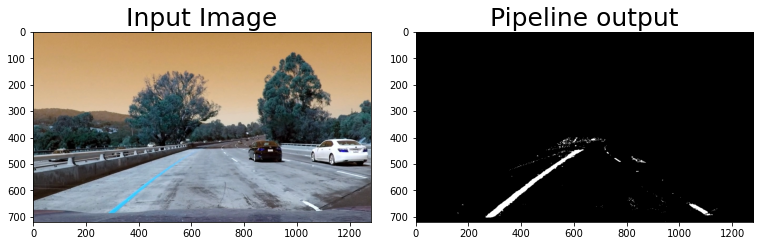

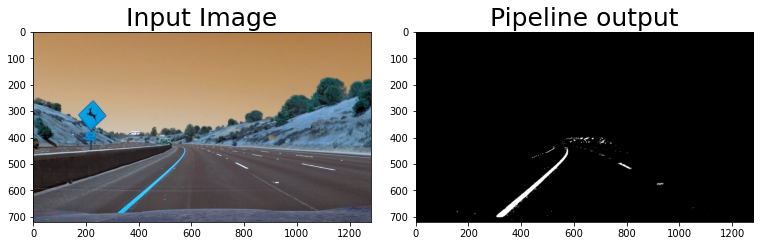

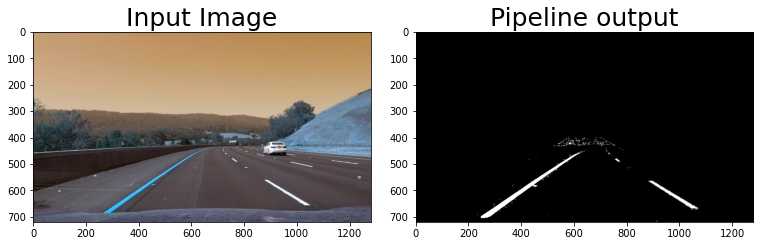

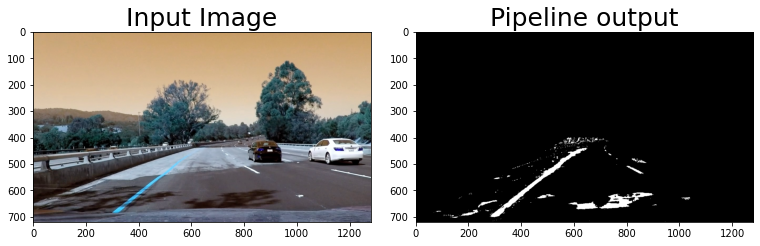

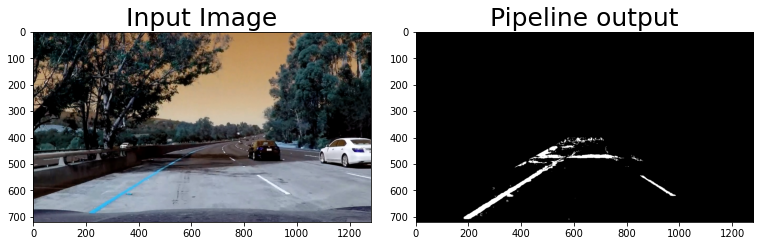

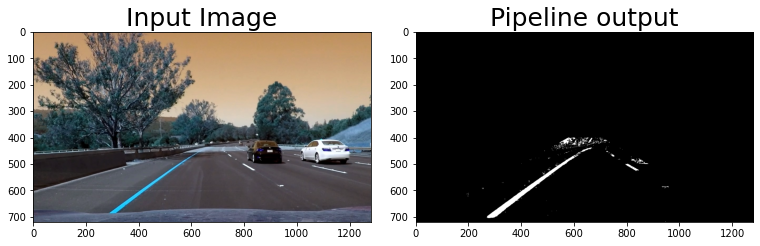

In [670]:
for i in range(1,7):
    fname = 'test_images/test{}.jpg'.format(i)
    image = cv2.imread(fname)
    result = pipeline(image)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Input Image', fontsize=25)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline output', fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
   

## 4. Lane detection

In [671]:
from sklearn.linear_model import (RANSACRegressor)
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

def Interpol_RanSac(X, y, x_plot):
    X = X.reshape(-1, 1)
    y = y.reshape(-1, 1)
    estimators = [('RANSAC', RANSACRegressor(max_trials = 100, min_samples = 150, \
                                             loss = "absolute_error", \
                                             residual_threshold=15.0,random_state=0))]#,

    for name, estimator in estimators:
        model = make_pipeline(PolynomialFeatures(2), estimator)
        model.fit(X, y)
        y_plot = model.predict(x_plot[:, np.newaxis])

    return y_plot

In [672]:
def sliding_windows_search(img):

    binary_warped = img.astype('uint8')
    
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int32(histogram.shape[0]/2)
    
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int32(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int32(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int32(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    return left_fit, right_fit, out_img

In [676]:
def lane_mask(img_undist, binary_warped, Minv, ploty, left_fitx, right_fitx):

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    middle_x = (left_fitx + right_fitx)/2
    middle_pts = np.transpose(np.vstack((middle_x, ploty))).astype(np.int32)
    
    cv2.polylines(color_warp, np.int32([middle_pts]), False, (0, 0, 255), thickness=10)
    cv2.polylines(color_warp, np.int32([pts_left]), False, (0, 0, 255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), False, (0, 0, 255), thickness=15)
        
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img_undist.shape[1], img_undist.shape[0]))

    # Combine the result with the original image
    result = cv2.addWeighted(img_undist, 1, newwarp, 0.3, 0)
    
    
    debug_canvas = (np.dstack((binary_warped, binary_warped, binary_warped))*255).astype(np.uint8)
    debug_result = cv2.addWeighted(debug_canvas, 1, color_warp, 0.4, 0)
    
    return result

In [677]:
def lane_tracking(img, left_fit, right_fit):
    
    binary_warped = img.astype('uint8')

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    window_img = np.zeros_like(out_img)
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100

    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) 
                      & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) 
                       & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Generate a polygon to illustrate the search window area
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
   
    
    return left_fit, right_fit, result

## 5. Finding lane curvature

In [678]:
def cal_curvature(ploty, left_fitx, right_fitx):
    
    y_eval = np.max(ploty)
    
    # Define conversions in x and y from pixels space to meters
    global ym_per_pix, xm_per_pix

    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/505/1.2054/0.97 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)

    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    # Calculate the offset of the car on the road
    
    lane_center = (left_fitx[-1]+right_fitx[-1])/2
        
    center_diff = (640-lane_center)*xm_per_pix
    
    return left_curverad, right_curverad, center_diff

In [679]:
def lane_chars(ploty, left_fitx, right_fitx):

    
    lane_width = (right_fitx - left_fitx)
    lane_width_mean = np.mean(lane_width)*xm_per_pix
    lane_width_var = np.var(lane_width)
    
    return lane_width_mean, lane_width_var

## 6. Image output

In [689]:
   def lane_finding(img_orig):
    
    img_undist = cv2.undistort(img_orig, mtx, dist, None, mtx)
    img_thresh = thresh_pipeline(img_undist, gradx_thresh=(25,255), grady_thresh=(10,255), s_thresh=(100, 255), v_thresh=(0, 255))

    img_birdeye = img_warp(img_thresh, src, dst)
    img_birdeye_color = img_warp(img_undist, src, dst)
            
    if (not line_l.detected) or (not line_r.detected):
        left_fit, right_fit, img_search = sliding_windows_search(img_birdeye)
  
    else:
        left_fit, right_fit, img_search = lane_tracking(img_birdeye, 
                                                        line_l.recent_xfitted[-1][0], 
                                                        line_r.recent_xfitted[-1][0]) 
    
    line_l.current_fit = [left_fit]
    line_r.current_fit = [right_fit]

    line_l.bestx = None
    line_r.bestx = None
    
    line_l.recent_xfitted.append([left_fit])
    line_r.recent_xfitted.append([right_fit])  

    if len(line_l.recent_xfitted)>1:
        
        line_l.best_fit = np.mean(np.array(line_l.recent_xfitted[-20:-1]),
                                axis=0) 
        line_r.best_fit = np.mean(np.array(line_r.recent_xfitted[-20:-1]),
                                axis=0)    
    else:
        line_l.best_fit = line_l.recent_xfitted[-1][0]
        line_r.best_fit = line_r.recent_xfitted[-1][0]  
            
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_birdeye.shape[0]-1, img_birdeye.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_curverad, right_curverad, center_diff = cal_curvature(ploty, left_fitx, right_fitx)
    lane_width_mean, lane_width_var = lane_chars(ploty, left_fitx, right_fitx)
    
    
    line_l.diffs = left_fit - line_l.best_fit 
    line_r.diffs = right_fit - line_r.best_fit    
    lane_continue = np.sum(line_l.diffs**2)+np.sum(line_r.diffs)
    
    if (not 3<lane_width_mean<5) or (lane_width_var>500) or (lane_continue>6000):   
        line_l.detected = False
        line_r.detected = False
        
        del line_l.recent_xfitted[-1]
        del line_r.recent_xfitted[-1]
        
        left_fit, right_fit = line_l.best_fit[0], line_r.best_fit[0]
                
    else:
        line_l.detected = True
        line_r.detected = True

        line_l.best_fit = np.mean(np.array(line_l.recent_xfitted[-20:]), axis=0) 
        line_r.best_fit = np.mean(np.array(line_r.recent_xfitted[-20:]), axis=0)
    

    
    # Recalculate the curvature and lane_width
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_curverad, right_curverad, center_diff = cal_curvature(ploty, left_fitx, right_fitx)
    lane_width_mean, lane_width_var = lane_chars(ploty, left_fitx, right_fitx)
        
    # Warp the detected lane boundaries back onto the original image.
    result = lane_mask(img_undist, img_birdeye, Minv, ploty, left_fitx, right_fitx, sign_model)
    cv2.putText(result, 'Left Curvature = '+str(round(left_curverad, 1))+'(m)', 
                (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    cv2.putText(result, 'Right Curvature = '+str(round(right_curverad, 1))+'(m)', 
                (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    cv2.putText(result, 'Vehicle shift (m) = '+ str(round(center_diff, 2)), 
                (50, 150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    cv2.putText(result, 'Lane width: '+str(round(lane_width_mean, 2))+'(m)', 
                (50, 200), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    if center_diff >= 0.5 or center_diff <= -0.5:
        cv2.putText(result, 'Lane departure warning!', (50, 250), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    else:
        cv2.putText(result, 'No lane departure', (50, 250), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

    canvas = np.zeros([720, 1280, 3], dtype=np.uint8)
    
    canvas[0:720, 0:1280, :] = result
    return canvas

In [681]:
global mtx, dist
mtx, dist = camera_matrix()

In [682]:
# Applying the perspective transform
perspective_transformer()

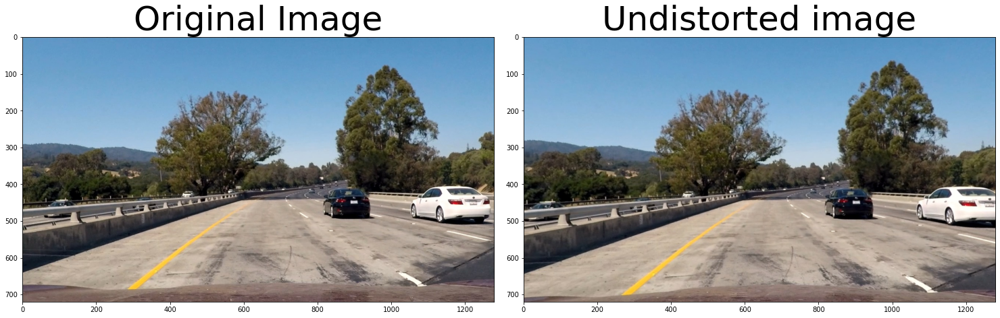

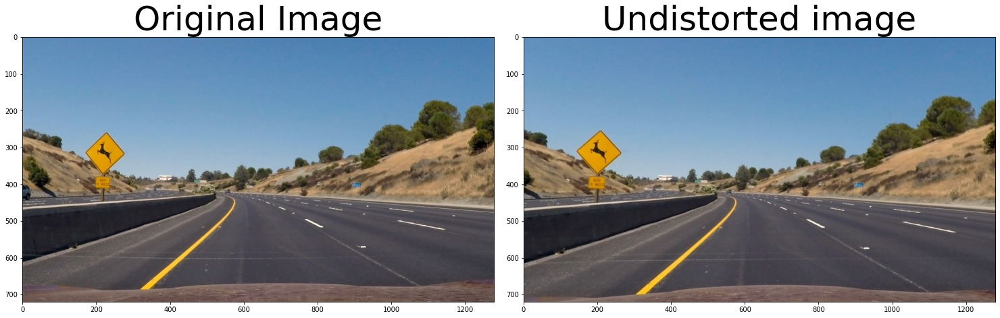

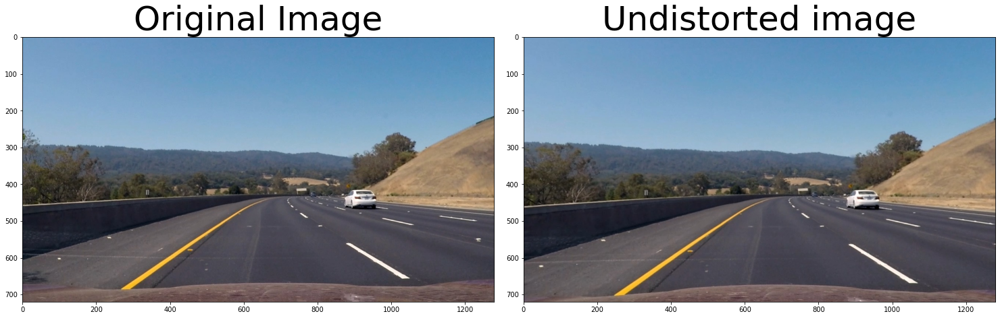

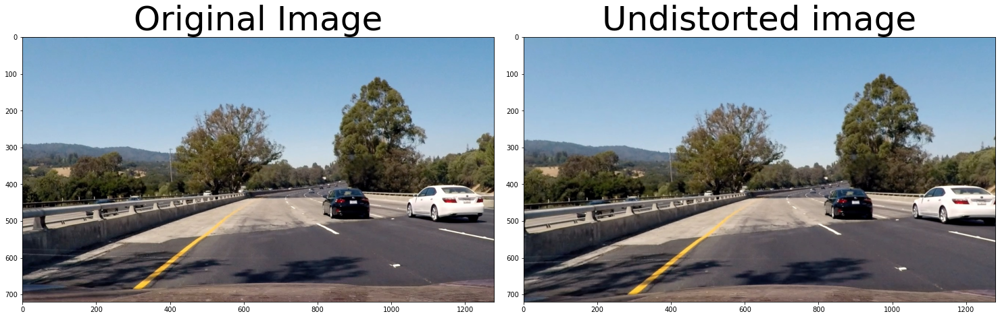

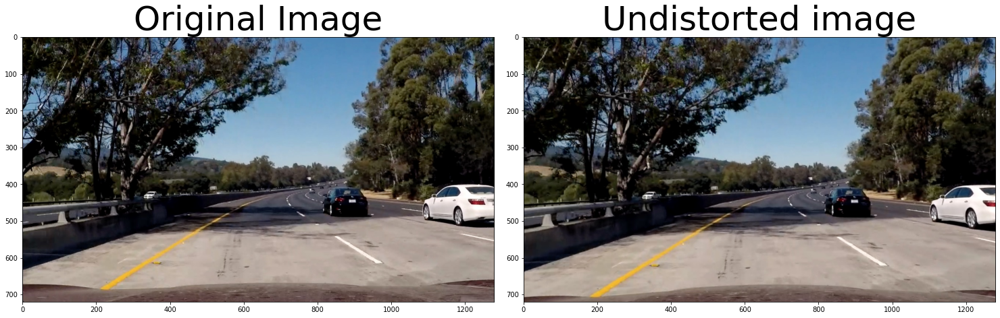

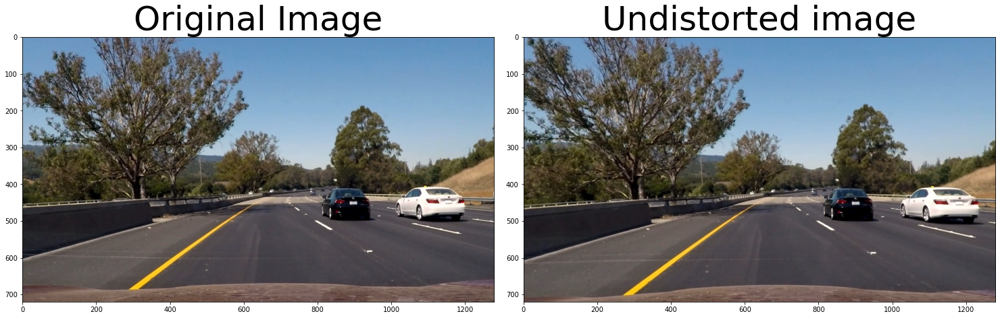

In [683]:
for i in range(1,7):
    fname = 'test_images/test{}.jpg'.format(i)
    img = mpimg.imread(fname)

    img_undist = cv2.undistort(img, mtx, dist, None, mtx)

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.tight_layout()
    ax1.set_title('Original Image', fontsize=50)
    ax1.imshow(img)
    ax2.set_title('Undistorted image', fontsize=50)
    ax2.imshow(img_undist)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

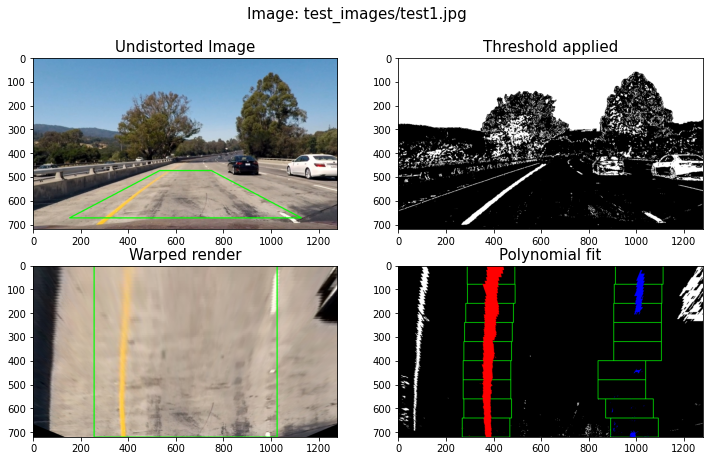

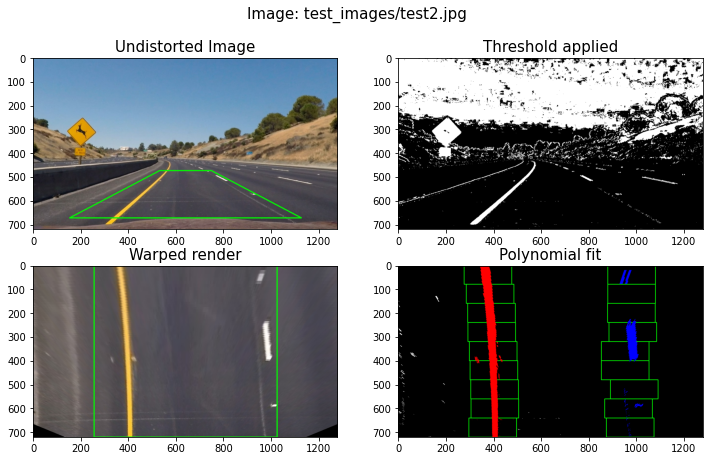

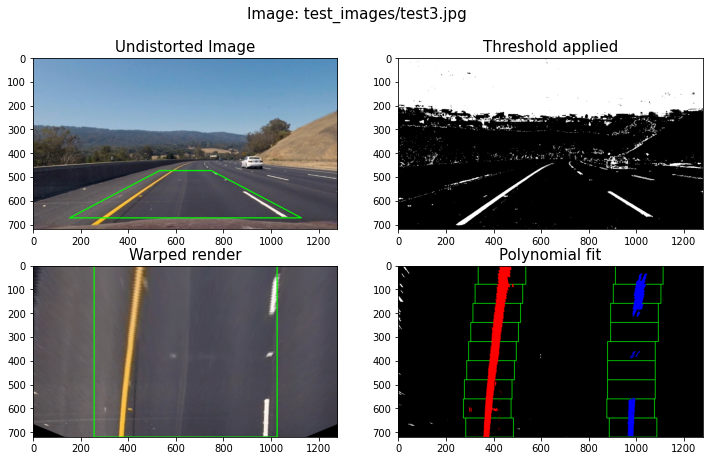

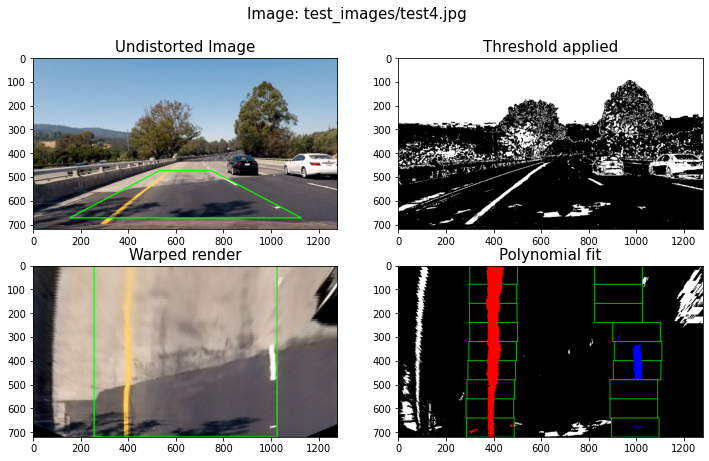

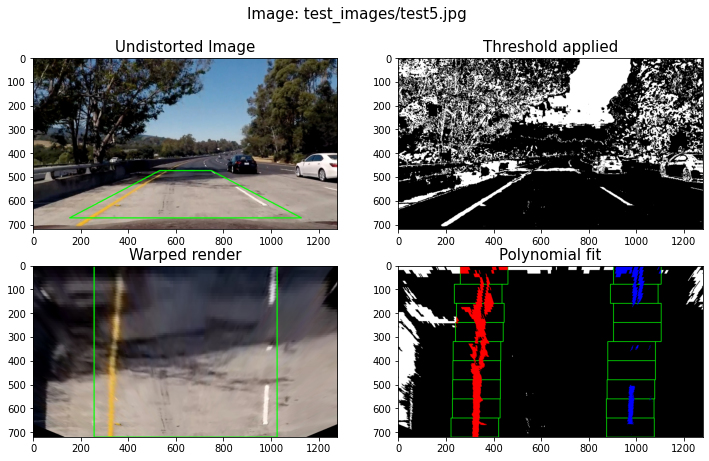

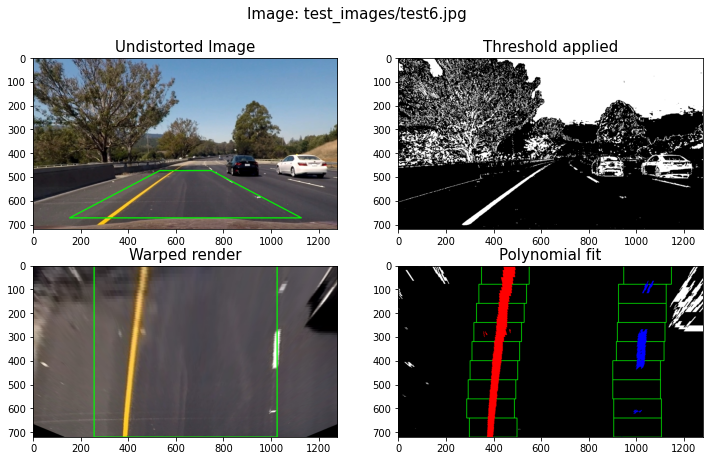

In [684]:
for i in range(1, 7):
  fname = 'test_images/test{}.jpg'.format(i)
  img = mpimg.imread(fname)
  img_undist = cv2.undistort(img, mtx, dist, None, mtx)
  warped_img = img_warp(img_undist, src, dst)
  img_thresh = thresh_pipeline(img_undist, 
                                gradx_thresh=(25,255), 
                                grady_thresh=(10,255), 
                                s_thresh=(100, 255), 
                                v_thresh=(0, 255))
  img_birdeye = img_warp(img_thresh, src, dst)                              
  left_fit, right_fit, img_search = sliding_windows_search(img_birdeye)

  ploty = np.linspace(0, img_birdeye.shape[0]-1, img_birdeye.shape[0])
  left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
  right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

  left_pts = np.transpose(np.vstack((left_fitx, ploty))).astype(np.int32)    
  right_pts = np.transpose(np.vstack((right_fitx, ploty))).astype(np.int32)

  warped_img_boxed = img_warp(img_undist, src, dst)

  cv2.polylines(img_undist, np.int32([src]), 
              True, (0, 255, 0), thickness=4)
  cv2.polylines(warped_img_boxed, np.int32([dst]), 
              True, (0, 255, 0), thickness=4)

  plt.figure(figsize=(12,7))
  cv2.polylines(undist_img, np.int32([src]), True, (0, 255, 0), thickness=4)
  cv2.polylines(img_birdeye_color, np.int32([dst]), True, (0, 255, 0), thickness=4)
  plt.suptitle('Image: {}'.format(fname), fontsize=15)

  plt.subplot(2, 2, 1)
  plt.title('Undistorted Image', fontsize=15)
  plt.imshow(img_undist)

  plt.subplot(2, 2, 2)
  plt.title('Threshold applied', fontsize=15)
  plt.imshow(img_thresh, cmap='gray')

  plt.subplot(2, 2, 3)
  plt.title('Warped render', fontsize=15)
  plt.imshow(warped_img_boxed)

  plt.subplot(2, 2, 4)
  plt.title('Polynomial fit', fontsize=15)
  plt.imshow(img_search)

In [685]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

In [686]:
import glob

1/1 [==============================] - 0s 101ms/step


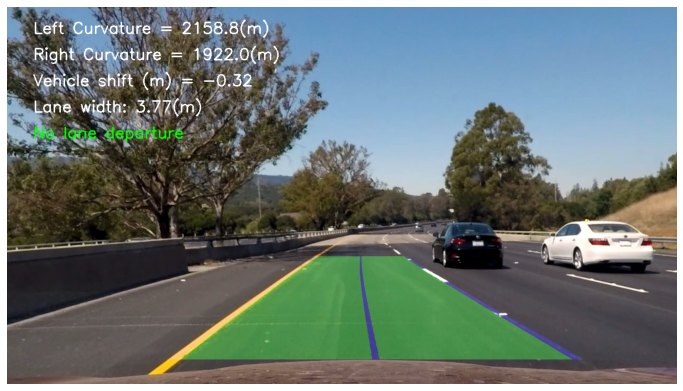

1/1 [==============================] - 0s 20ms/step


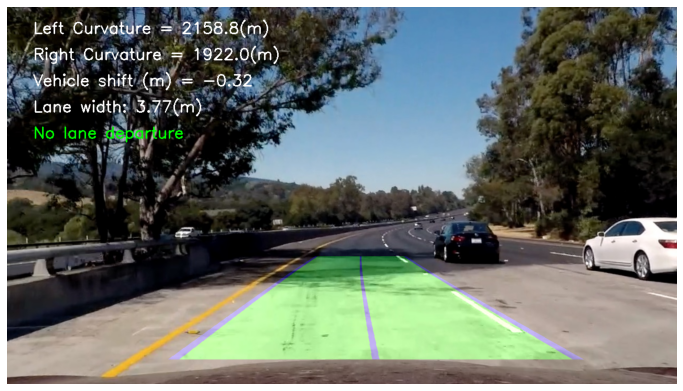

1/1 [==============================] - 0s 43ms/step


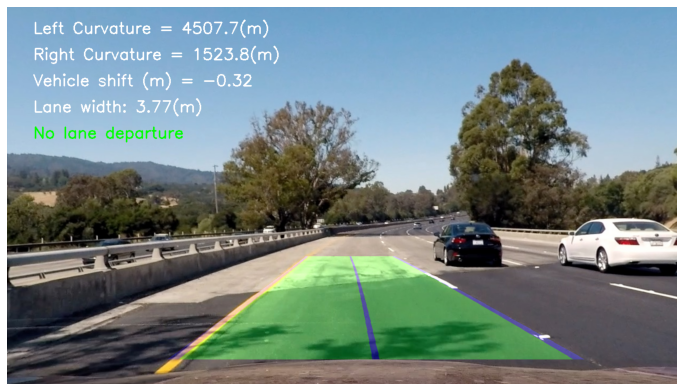

1/1 [==============================] - 0s 20ms/step


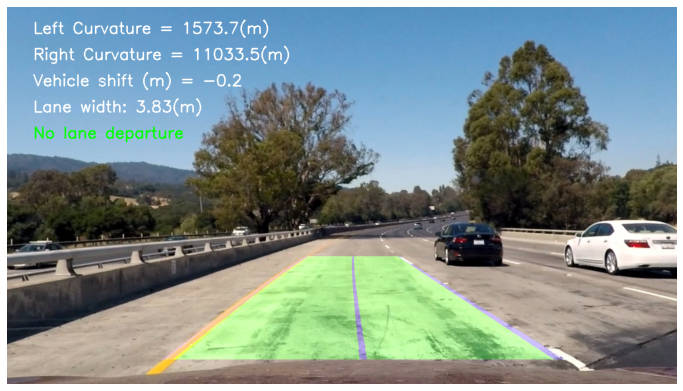

1/1 [==============================] - 0s 20ms/step


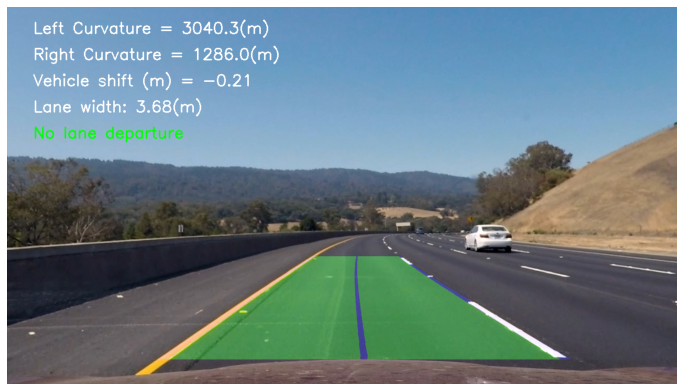

1/1 [==============================] - 0s 19ms/step


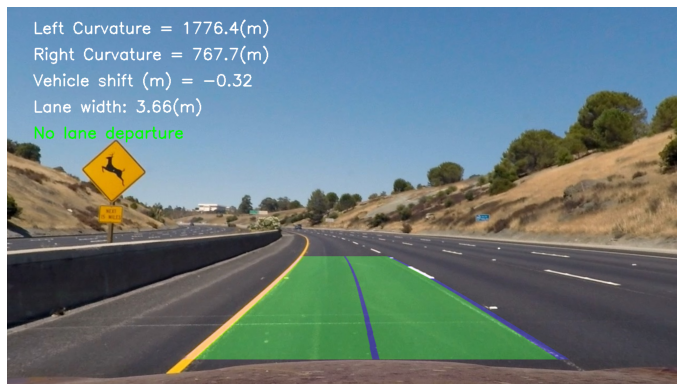

In [690]:
line_l = Line()
line_r = Line()

# Make a list of test images
test_files = 'test_images/test*.jpg'
images = glob.glob(test_files)

# Step through the list and search for chessboard corners
for fname in images:
    
    line_l.detected = False
    line_r.detected = False
    
    img_orig = cv2.imread(fname)
    img_orig = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
    img_output = lane_finding(img_orig)
    plt.figure(figsize=(12,9))
    plt.imshow(img_output)
    plt.axis('off')
    plt.show()

## 8. Video detection

Key features:

- Evaluation of different thresholds, color spaces, and color channels for lane identification.
- Flexibility in selecting the best combination of thresholds for each side (left and right).
- Assessing the quality of lane detection using the absolute error between the current and previous polynomial fit.
- Checking the curve flection and lane position for quality evaluation.
- Comparison of curve flection and lane position values with predefined thresholds.
- Adding the current data set to the mean value stack if position and flection are within acceptable ranges.
- Applying damping value for slight deviations in position and flection values.
- Dismissing unreliable lane data and retaining previous values if significant errors are detected.

In [53]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from collections import deque
from sklearn.metrics import mean_absolute_error
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip

In [691]:
line_l = Line()
line_r = Line()

clip1_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
video_clip1 = clip1.fl_image(lane_finding) 
%time video1_clip.write_videofile(video1_output, audio=False)

1/1 [==============================] - 0s 136ms/step
Moviepy - Building video project_video_output.mp4.
Moviepy - Writing video project_video_output.mp4



t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

TypeError: lane_mask() missing 1 required positional argument: 'model'

In [345]:
HTML("""<video width="960" height="540" controls><source src="{0}"></video>""".format(clip1_output))

In [365]:
line_l = Line()
line_r = Line()

clip2_output = 'hard_challenge_video_output.mp4'
clip2 = VideoFileClip("harder_challenge_video.mp4")
video_clip2 = clip2.fl_image(lane_finding) 
%time video_clip2.write_videofile(clip2_output, audio=False)


                                                            


                                                               

                                                           

t:  62%|██████▏   | 782/1260 [05:26<00:21, 22.30it/s, now=None]

                                                            


                                                               

                                                           

t:  62%|██████▏   | 782/1260 [05:26<00:21, 22.30it/s, now=None]


Moviepy - Building video hard_challenge_video_output.mp4.
Moviepy - Writing video hard_challenge_video_output.mp4



Moviepy - Done !
Moviepy - video ready hard_challenge_video_output.mp4
CPU times: user 1min 19s, sys: 9.75 s, total: 1min 28s
Wall time: 1min 8s


In [366]:
HTML("""<video width="960" height="540" controls><source src="{0}"></video>""".format(clip2_output))